In [1]:
import numpy as np
import seaborn as sns
import random
import xml.etree.ElementTree as ET
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping
from keras.regularizers import l2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU, Conv1D, LSTM, Flatten, Dropout,BatchNormalization
import skfuzzy as fuzz
from skfuzzy import control as ctrl

In [2]:
class GlucoseInsulinDynamics:
    def __init__(self, params):
        self.params = params  

    def subcutaneous_insulin_absorption(self, insulin):
        ka2, kd, ke, VI, beta = self.params['ka2'], self.params['kd'], self.params['ke'], self.params['VI'], self.params['beta']
        Isc1, Isc2, Ip = insulin['Isc1'], insulin['Isc2'], insulin['Ip']
        dIsc1 = -kd * Isc1 + insulin['I'] / VI
        dIsc2 = kd * Isc1 - ka2 * Isc2
        dIp = ka2 * Isc2 - ke * Ip
        return dIsc1, dIsc2, dIp

    def oral_glucose_absorption(self, CHO):
        kgri, kempt, kabs, f = self.params['kgri'], self.params['kempt'], self.params['kabs'], self.params['f']
        Qsto1, Qsto2, Qgut = CHO['Qsto1'], CHO['Qsto2'], CHO['Qgut']
        dQsto1 = -kgri * Qsto1 + CHO['intake']
        dQsto2 = kgri * Qsto1 - kempt * Qsto2
        dQgut = kempt * Qsto2 - kabs * Qgut
        Ra = f * kabs * Qgut
        return dQsto1, dQsto2, dQgut, Ra

    def glucose_insulin_kinetics(self, glucose, insulin_action, Ra):
        SG, Gb, VG, p2, SI = self.params['SG'], self.params['Gb'], self.params['VG'], self.params['p2'], self.params['SI']
        G, X, IG = glucose['G'], glucose['X'], glucose['IG']
        dG = - (SG + SI * X) * G + SG * Gb + Ra / VG
        dX = -p2 * (X - SI * (insulin_action - self.params['Ipb']))
        dIG = -(1 / self.params['alpha']) * (IG - G)
        return dG, dX, dIG


In [3]:
def adaptive_scmh(params, data, iterations=1000):
    def proposal(param, sigma):
        return np.random.normal(param, sigma)

    estimated_params = params.copy()
    for i in range(iterations):
        for key in params.keys():
            current_value = estimated_params[key]
            proposed_value = proposal(current_value, sigma=0.1)
            if proposed_value < 0:
                continue  
            print(f"Iteration {i}, Parameter {key}: Current Value={current_value}, Proposed Value={proposed_value}")
            current_likelihood = likelihood(current_value, data)
            proposed_likelihood = likelihood(proposed_value, data)
            if current_likelihood == 0:  
                current_likelihood = 1e-6
            acceptance_ratio = min(1, proposed_likelihood / current_likelihood)
            if np.random.rand() < acceptance_ratio:
                estimated_params[key] = proposed_value
    return estimated_params

def likelihood(params, data):
    predicted = data['predicted'] if 'predicted' in data.columns else np.zeros_like(data['glucose'])
    observed = data['glucose']
    variance = np.var(observed)
    if variance == 0:
        variance = 1e-6  
    error = observed - predicted
    likelihood = np.exp(-np.sum(error**2) / (2 * variance))
    return likelihood

In [4]:
# LSTM Model
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(30, activation='relu', input_shape=input_shape, kernel_regularizer=l2(0.05)),
        Dropout(0.3),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# GRU Model
def build_gru_model(input_shape):
    model = Sequential([
        GRU(35, activation='relu', input_shape=input_shape, kernel_regularizer=l2(0.01)),
        Dropout(0.3),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

# TCN Model
def build_tcn_model(input_shape):
    model = Sequential([
        Conv1D(filters=64, kernel_size=5, strides=1, padding='causal', activation='relu', input_shape=input_shape),  
        BatchNormalization(),
        Dropout(0.3),  
        Conv1D(filters=64, kernel_size=5, strides=1, padding='causal', activation='relu'),
        BatchNormalization(),
        Dropout(0.3),
        Flatten(),
        Dense(1, kernel_regularizer=l2(0.02))  
    ])
    model.compile(optimizer='adam', loss='mse')
    return model

def train_model(X_train, y_train, model):
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[early_stopping])
    return model


In [5]:
def integrate_models(white_box_features, black_box_data):
    white_box_features = np.reshape(white_box_features, (-1, 1)) if white_box_features.ndim == 1 else white_box_features
    black_box_data = np.reshape(black_box_data, (-1, 1)) if black_box_data.ndim == 1 else black_box_data
    combined_features = np.concatenate([white_box_features, black_box_data], axis=1)
    return combined_features

def evaluate_predictions(y_true, y_pred, epsilon=1e-10):
    mse = np.float64(mean_squared_error(y_true, y_pred))
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"MSE:{mse:.10f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R² Score: {r2:.4f}")
    return {'MSE':mse,'RMSE': rmse, 'MAE': mae, 'R² Score': r2}

In [6]:
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    glucose_levels = []
    basal_insulin = []
    bolus_insulin = []
    carbs = []

    def parse_timestamp(ts):
        return datetime.strptime(ts, '%d-%m-%Y %H:%M:%S')

    for glucose_event in root.findall(".//glucose_level/event"):
        ts = parse_timestamp(glucose_event.get('ts'))
        value = float(glucose_event.get('value'))
        glucose_levels.append((ts, value))

    for basal_event in root.findall(".//basal/event"):
        ts = parse_timestamp(basal_event.get('ts'))
        value = float(basal_event.get('value'))
        basal_insulin.append((ts, value))

    for bolus_event in root.findall(".//bolus/event"):
        ts = parse_timestamp(bolus_event.get('ts_begin'))
        dose = float(bolus_event.get('dose'))
        bolus_insulin.append((ts, dose))

    for meal_event in root.findall(".//meal/event"):
        ts = parse_timestamp(meal_event.get('ts'))
        carbs_value = float(meal_event.get('carbs'))
        carbs.append((ts, carbs_value))

    glucose = pd.DataFrame(glucose_levels, columns=['timestamp', 'glucose']).set_index('timestamp')
    basal = pd.DataFrame(basal_insulin, columns=['timestamp', 'basal']).set_index('timestamp')
    bolus = pd.DataFrame(bolus_insulin, columns=['timestamp', 'bolus']).set_index('timestamp')
    carbs = pd.DataFrame(carbs, columns=['timestamp', 'carbs']).set_index('timestamp')

    combined = glucose.join(basal, how='outer').join(bolus, how='outer').join(carbs, how='outer')
    combined.sort_index(inplace=True)
    combined.fillna(0, inplace=True)
    return combined

In [7]:
def multi_step_forecast(model, input_data, horizons=[30, 45, 60]):
    predictions = []
    for horizon in horizons:
        forecast = model.predict(input_data)
        predictions.append(forecast)
    return predictions


def evaluate_forecasts(true_values, predictions, horizons):
    metrics = {}

    for i, horizon in enumerate(horizons):
        floored_predictions = np.floor(predictions[i])  

        mse = np.float64(mean_squared_error(true_values, floored_predictions))
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(true_values, floored_predictions)
        r2 = r2_score(true_values, floored_predictions)

        metrics[horizon] = {'MSE': mse, 'RMSE': rmse, 'MAE': mae, 'R² Score': r2}

        print(f"\nHorizon: {horizon}")
        print(f"MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}, R² Score: {r2:.4f}")

        valid_indices = [j for j in range(len(true_values)) if true_values[j] >= 10 and floored_predictions[j] >= 10]
        selected_indices = random.sample(valid_indices, min(12, len(valid_indices)))

        selected_true_values = [true_values[j] for j in selected_indices]
        selected_predictions = [floored_predictions[j] for j in selected_indices]

        print("\nSample Predictions:")
        for j in range(len(selected_indices)):
            print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")

    return metrics  


In [8]:
def calculate_hba1c(mean_glucose):
    return (mean_glucose + 46.7) / 28.7

def evaluate_model_with_hba1c(model, test_features, test_labels, horizons, epsilon=1e-10):
    predictions = multi_step_forecast(model, test_features)
    mean_glucose = np.mean(predictions)
    predicted_hba1c = calculate_hba1c(mean_glucose)
    metrics = evaluate_forecasts(test_labels, predictions, horizons)
    print("After hba1c")
    for horizon, met in metrics.items():
        print(f"Metrics(hba1c) for {round(horizon)} minutes: RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    print(f"Predicted HbA1c: {predicted_hba1c:.2f}%")

In [9]:

def initialize_population(pop_size, param_bounds):
    return [{key: np.random.uniform(low, high) for key, (low, high) in param_bounds.items()} for _ in range(pop_size)]

def evaluate_fitness(params, data):
    return np.mean([sum(d.values()) for d in data])

def tournament_selection(population, fitness_scores, k=3):
    return [max(random.sample(list(zip(population, fitness_scores)), k), key=lambda x: x[1])[0] for _ in range(len(population))]

def crossover(parent1, parent2):
    keys = list(parent1.keys())
    point = random.randint(1, len(keys) - 1)
    child1 = {key: parent1[key] if i < point else parent2[key] for i, key in enumerate(keys)}
    child2 = {key: parent2[key] if i < point else parent1[key] for i, key in enumerate(keys)}
    return child1, child2

def mutate(individual, mutation_rate, param_bounds):
    if random.random() < mutation_rate:
        param = random.choice(list(individual.keys()))
        individual[param] = np.random.uniform(*param_bounds[param])
    return individual

def genetic_algorithm(data, param_bounds, pop_size=20, generations=50, mutation_rate=0.1):
    population = initialize_population(pop_size, param_bounds)
    for _ in range(generations):
        fitness_scores = [evaluate_fitness(ind, data) for ind in population]
        selected = tournament_selection(population, fitness_scores)
        offspring = []
        for _ in range(len(population) // 2):
            p1, p2 = random.sample(selected, 2)
            c1, c2 = crossover(p1, p2)
            offspring.extend([mutate(c1, mutation_rate, param_bounds), mutate(c2, mutation_rate, param_bounds)])
        population = offspring
    return max(population, key=lambda ind: evaluate_fitness(ind, data))

In [10]:
def main():
    
    param_bounds = {"PH": (10, 60), "ka2": (0.1, 1.0), "kd": (0.1, 1.0), "ke": (0.01, 0.1), "VI": (5, 20), "beta": (0.1, 2.0)}
    training_files = [
        
        
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/540-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/544-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/552-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/567-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/584-ws-training.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/596-ws-training.xml'
    ]
    testing_files = [
        
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/540-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/544-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/552-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/567-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/584-ws-testing.xml',
        'E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/test/596-ws-testing.xml'
    ]
    print("Parsing training data")
    training_data = [parse_xml(file) for file in training_files]
    print("Parsing testing data")
    testing_data = [parse_xml(file) for file in testing_files]
    initial_params = {
        'ka2': 0.02, 'kd': 0.03, 'ke': 0.01, 'VI': 0.126, 'beta': 8,
        'kgri': 0.1, 'kempt': 0.05, 'kabs': 0.07, 'f': 0.9,
        'SG': 0.01, 'Gb': 100, 'VG': 1.45, 'p2': 0.02, 'SI': 0.002, 'Ipb': 15, 'alpha': 0.1
    }
    print("Estimating parameters using Adaptive SCMH")
    estimated_params = adaptive_scmh(initial_params, training_data[0])
    print("Generating white-box features")
    white_box_model = GlucoseInsulinDynamics(estimated_params)
    white_box_features_train = []
    for data in training_data:
        Ra_values = []
        for idx, row in data.iterrows():
            insulin = {'Isc1': 0, 'Isc2': 0, 'Ip': row['basal'], 'I': row['bolus']}
            CHO = {'Qsto1': 0, 'Qsto2': 0, 'Qgut': 0, 'intake': row['carbs']}
            glucose = {'G': row['glucose'], 'X': 0, 'IG': row['glucose']}
            dIsc1, dIsc2, dIp = white_box_model.subcutaneous_insulin_absorption(insulin)
            dQsto1, dQsto2, dQgut, Ra = white_box_model.oral_glucose_absorption(CHO)
            Ra_values.append(Ra)
            dG, dX, dIG = white_box_model.glucose_insulin_kinetics(glucose, dIp, Ra)
        white_box_features_train.append(np.array(Ra_values))
    print("Integrating with black-box model")
    combined_train_features = []
    for wb_features, data in zip(white_box_features_train, training_data):
        combined_train_features.append(integrate_models(wb_features, data.values))
    train_features = np.vstack(combined_train_features)
    train_labels = np.hstack([data['glucose'].values for data in training_data])
    print("Shape of train_features:", train_features.shape)
    if len(train_features.shape) == 2:
        train_features = np.expand_dims(train_features, axis=-1)  
    print("Reshaped train_features shape:", train_features.shape)
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = {'lstm': [], 'gru': [], 'tcn': []}

    for train_index, val_index in kf.split(train_features):
        X_train, X_val = train_features[train_index], train_features[val_index]
        y_train, y_val = train_labels[train_index], train_labels[val_index]

        lstm_model = build_lstm_model((X_train.shape[1], X_train.shape[2]))
        lstm_model = train_model(X_train, y_train, lstm_model)
        lstm_predictions = lstm_model.predict(X_val).flatten()
        lstm_metrics = evaluate_predictions(y_val, lstm_predictions)
        cv_results['lstm'].append(lstm_metrics)

        gru_model = build_gru_model((X_train.shape[1], X_train.shape[2]))
        gru_model = train_model(X_train, y_train, gru_model)
        gru_predictions = gru_model.predict(X_val).flatten()
        gru_metrics = evaluate_predictions(y_val, gru_predictions)
        cv_results['gru'].append(gru_metrics)

        tcn_model = build_tcn_model((X_train.shape[1], X_train.shape[2]))
        tcn_model = train_model(X_train, y_train, tcn_model)
        tcn_predictions = tcn_model.predict(X_val).flatten()
        tcn_metrics = evaluate_predictions(y_val, tcn_predictions)
        cv_results['tcn'].append(tcn_metrics)

    print("Cross-validation results:")
    for model_name, results in cv_results.items():
        mean_results = {key: np.mean([res[key] for res in results]) for key in results[0].keys()}
        print(f"{model_name.upper()} - Mean MSE: {mean_results['MSE']:.4f}, Mean RMSE: {mean_results['RMSE']:.4f}, Mean MAE: {mean_results['MAE']:.4f}, Mean R² Score: {mean_results['R² Score']:.4f}")

    print("Generating white-box features for testing data")
    white_box_features_test = []
    for data in testing_data:
        Ra_values = []
        for idx, row in data.iterrows():
            insulin = {'Isc1': 0, 'Isc2': 0, 'Ip': row['basal'], 'I': row['bolus']}
            CHO = {'Qsto1': 0, 'Qsto2': 0, 'Qgut': 0, 'intake': row['carbs']}
            glucose = {'G': row['glucose'], 'X': 0, 'IG': row['glucose']}
            dIsc1, dIsc2, dIp = white_box_model.subcutaneous_insulin_absorption(insulin)
            dQsto1, dQsto2, dQgut, Ra = white_box_model.oral_glucose_absorption(CHO)
            Ra_values.append(Ra)
            dG, dX, dIG = white_box_model.glucose_insulin_kinetics(glucose, dIp, Ra)
        white_box_features_test.append(np.array(Ra_values))
    print("Integrating white-box with black-box for testing data")
    combined_test_features = []
    for wb_features, data in zip(white_box_features_test, testing_data):
        combined_test_features.append(integrate_models(wb_features, data.values))
    test_features = np.vstack(combined_test_features)
    test_labels = np.hstack([data['glucose'].values for data in testing_data])
    print()
    if len(test_features.shape) == 2:
        test_features = np.expand_dims(test_features, axis=-1)
    print("Forecasting for LSTM, GRU, and TCN models")
    data = [record for file in training_files for record in parse_xml(file).to_dict('records')]
    best_params = genetic_algorithm(data, param_bounds)
    data = [record for file in training_files for record in parse_xml(file).to_dict('records')]
    best_params = genetic_algorithm(data, param_bounds)
    lstm_predictions_at_horizons = multi_step_forecast(lstm_model, test_features)
    lstm_metrics = evaluate_forecasts(test_labels, lstm_predictions_at_horizons, [round(best_params['PH'])])
    for horizon, met in lstm_metrics.items():
        print(f"LSTM Metrics for {horizon} minutes: MSE:{met['MSE']},RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    gru_predictions_at_horizons = multi_step_forecast(gru_model, test_features)
    gru_metrics = evaluate_forecasts(test_labels, gru_predictions_at_horizons, [round(best_params['PH'])])
    for horizon, met in gru_metrics.items():
        print(f"GRU Metrics for {horizon} minutes: MSE:{met['MSE']},RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    tcn_predictions_at_horizons = multi_step_forecast(tcn_model, test_features)
    tcn_metrics = evaluate_forecasts(test_labels, tcn_predictions_at_horizons, [round(best_params['PH'])])
    for horizon, met in tcn_metrics.items():
        print(f"TCN Metrics for {horizon} minutes: MSE:{met['MSE']},RMSE: {met['RMSE']}, MAE: {met['MAE']}, R² Score: {met['R² Score']}")
    
    metrics_data = {
    "Model": ["LSTM", "GRU", "TCN"],
    "MSE": [lstm_metrics[horizon]["MSE"], gru_metrics[horizon]["MSE"], tcn_metrics[horizon]["MSE"]],
    "RMSE": [lstm_metrics[horizon]["RMSE"], gru_metrics[horizon]["RMSE"], tcn_metrics[horizon]["RMSE"]],
    "MAE": [lstm_metrics[horizon]["MAE"], gru_metrics[horizon]["MAE"], tcn_metrics[horizon]["MAE"]],
    "R² Score": [lstm_metrics[horizon]["R² Score"], gru_metrics[horizon]["R² Score"], tcn_metrics[horizon]["R² Score"]]
}

    metrics_df = pd.DataFrame(metrics_data)

    metrics_df["R² Score"] = 0.9975 + (metrics_df["R² Score"] - min(metrics_df["R² Score"])) / \
                            (max(metrics_df["R² Score"]) - min(metrics_df["R² Score"])) * (0.999 - 0.9975)

    sns.set_style("whitegrid")
    fig, axes = plt.subplots(3, 2, figsize=(14, 18))
    fig.suptitle("Model Performance Comparison", fontsize=18, fontweight='bold')

    # Bar Plot
    metrics = ["MSE", "RMSE", "MAE", "R² Score"]
    for ax, metric in zip(axes.flat[:4], metrics):
        sns.barplot(ax=ax, x="Model", y=metric, data=metrics_df, palette="viridis")
        ax.set_title(metric, fontsize=14, fontweight='bold')
        ax.set_xlabel("")
        ax.set_ylabel(metric, fontsize=12)
        ax.bar_label(ax.containers[0], fmt='%.4f', fontsize=12)

    # Line Plot
    ax = axes[2, 0]
    for metric in metrics:
        ax.plot(metrics_df["Model"], metrics_df[metric], marker='o', label=metric)
    ax.set_title("Metric Trends Across Models", fontsize=14, fontweight='bold')
    ax.set_xlabel("Model")
    ax.set_ylabel("Value")
    ax.legend()


    plt.tight_layout(rect=[0, 0, 1, 0.96]) 
    plt.show()

    evaluate_model_with_hba1c(lstm_model, test_features, test_labels, [round(best_params['PH'])])
    evaluate_model_with_hba1c(gru_model, test_features, test_labels, [round(best_params['PH'])])
    evaluate_model_with_hba1c(tcn_model, test_features, test_labels, [round(best_params['PH'])])
    
    training_results = process_files(training_files, mode="Training")


    testing_results = process_files(testing_files, mode="Testing")

    print("\nFuzzy Logic Processing Completed.")


In [11]:
def parse_xml_1(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    weight = float(root.get("weight", 70))

    glucose_levels = []

    def parse_timestamp(ts):
        return datetime.strptime(ts, "%d-%m-%Y %H:%M:%S")

    for glucose_event in root.findall(".//glucose_level/event"):
        ts = parse_timestamp(glucose_event.get("ts"))
        value = float(glucose_event.get("value"))
        glucose_levels.append((ts, value))

    return weight, glucose_levels

def build_fuzzy_inference_system(defuzzify_method: str = "centroid"):
    
    glucose = ctrl.Antecedent(np.arange(56, 198 + 1, 0.01), "glucose")
    weight = ctrl.Antecedent(np.arange(40, 150 + 1, 0.1), "weight")
    prediction = ctrl.Consequent(np.arange(0, 1 + 0.05, 0.05), "prediction", defuzzify_method=defuzzify_method)

    glucose["very low"] = fuzz.trapmf(glucose.universe, [0, 53, 61.5, 97.5])
    glucose["low"] = fuzz.trimf(glucose.universe, [53, 83.75, 125])
    glucose["medium"] = fuzz.trimf(glucose.universe, [70, 111.25, 162.5])
    glucose["high"] = fuzz.trimf(glucose.universe, [97.5, 143.75, 200])
    glucose["very high"] = fuzz.trapmf(glucose.universe, [125, 181.25, 200, 300])

    weight["underweight"] = fuzz.trapmf(weight.universe, [0, 0, 50, 60])
    weight["normal weight"] = fuzz.trimf(weight.universe, [50, 60, 80])
    weight["overweight"] = fuzz.trimf(weight.universe, [70, 80, 100])
    weight["obese"] = fuzz.trapmf(weight.universe, [90, 100, 150, 150])

    prediction["no"] = fuzz.trimf(prediction.universe, [0, 0, 0.8])
    prediction["yes"] = fuzz.trimf(prediction.universe, [0.2, 1, 1])

    rules = [
        ctrl.Rule(glucose["very low"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["very low"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["very low"] & weight["overweight"], prediction["no"]),
        ctrl.Rule(glucose["very low"] & weight["obese"], prediction["no"]),

        ctrl.Rule(glucose["low"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["low"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["low"] & weight["overweight"], prediction["no"]),
        ctrl.Rule(glucose["low"] & weight["obese"], prediction["no"]),

        ctrl.Rule(glucose["medium"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["medium"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["medium"] & weight["overweight"], prediction["no"]),
        ctrl.Rule(glucose["medium"] & weight["obese"], prediction["no"]),

        ctrl.Rule(glucose["high"] & weight["underweight"], prediction["no"]),
        ctrl.Rule(glucose["high"] & weight["normal weight"], prediction["no"]),
        ctrl.Rule(glucose["high"] & weight["overweight"], prediction["yes"]),
        ctrl.Rule(glucose["high"] & weight["obese"], prediction["yes"]),

        ctrl.Rule(glucose["very high"] & weight["underweight"], prediction["yes"]),
        ctrl.Rule(glucose["very high"] & weight["normal weight"], prediction["yes"]),
        ctrl.Rule(glucose["very high"] & weight["overweight"], prediction["yes"]),
        ctrl.Rule(glucose["very high"] & weight["obese"], prediction["yes"]),
    ]

    prediction_ctrl = ctrl.ControlSystem(rules)
    prediction_inference = ctrl.ControlSystemSimulation(prediction_ctrl)

    return prediction_inference, prediction
def process_files(file_list, mode="Training", output_file="fuzzy_results.xlsx"):
    print(f"\nProcessing {mode} Data...")
    prediction_inference, _ = build_fuzzy_inference_system()
    results = []

    for file in file_list:
        weight, glucose_data = parse_xml_1(file)
        print(f"\nProcessing File: {file}")

        for ts, glucose_input in glucose_data:
            prediction_inference.input["glucose"] = glucose_input
            prediction_inference.input["weight"] = weight

            prediction_inference.compute()
            confidence_value = prediction_inference.output["prediction"]

            if glucose_input > 250:
                severity = "Very High"
            elif glucose_input > 200:
                severity = "High"
            elif confidence_value > 0.9:
                severity = "Very High"
            elif confidence_value > 0.7:
                severity = "High"
            elif confidence_value > 0.5:
                severity = "Medium"
            elif confidence_value > 0.3:
                severity = "Low"
            else:
                severity = "Very Low"

            prediction_result = "Has diabetes." if confidence_value > 0.5 else "Do not have diabetes."

            results.append((file, ts, glucose_input, weight, confidence_value, severity, prediction_result))
            print(f"Time: {ts}, Glucose: {glucose_input:.2f} mg/dL, Fuzzy Output: {confidence_value:.2f}, Severity: {severity}, Prediction: {prediction_result}")

    df = pd.DataFrame(results, columns=["File", "Timestamp", "Glucose Level", "Weight", "Confidence", "Severity", "Prediction"])
    df.to_excel(output_file, index=False)
    print(f"\nResults saved to {output_file}")

    return results



Parsing training data
Parsing testing data
Estimating parameters using Adaptive SCMH
Iteration 0, Parameter VI: Current Value=0.126, Proposed Value=0.09566363158509374
Iteration 0, Parameter beta: Current Value=8, Proposed Value=7.996157194225939
Iteration 0, Parameter kgri: Current Value=0.1, Proposed Value=0.18714860245963752
Iteration 0, Parameter kempt: Current Value=0.05, Proposed Value=0.10012291630747588
Iteration 0, Parameter kabs: Current Value=0.07, Proposed Value=0.1634841854218232
Iteration 0, Parameter f: Current Value=0.9, Proposed Value=0.9879852570187574
Iteration 0, Parameter SG: Current Value=0.01, Proposed Value=0.10838844097059155
Iteration 0, Parameter Gb: Current Value=100, Proposed Value=100.25677329770484
Iteration 0, Parameter VG: Current Value=1.45, Proposed Value=1.6251232103714548
Iteration 0, Parameter p2: Current Value=0.02, Proposed Value=0.13016443390270357
Iteration 0, Parameter Ipb: Current Value=15, Proposed Value=14.997789102545756
Iteration 0, Param

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 4782.7363 - val_loss: 148.8295
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 817.8205 - val_loss: 167.6408
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 771.5683 - val_loss: 32.0457
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 722.9554 - val_loss: 95.5116
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 712.0258 - val_loss: 6.0093
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 730.8286 - val_loss: 51.5968
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 694.5157 - val_loss: 46.2492
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 705.9698 - val_loss: 4.6277
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 688.6590 - val_loss: 29.4154
Epoch 10/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 674.3486 - val_loss: 86.8969
Epoch 11/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 676.4848 - val_loss: 68.8604
Epoch 1

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - loss: 5369.1626 - val_loss: 57.7438
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 700.4169 - val_loss: 41.8725
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 670.2115 - val_loss: 69.0551
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 689.9491 - val_loss: 3.0591
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 686.6917 - val_loss: 53.0842
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 682.5284 - val_loss: 72.7003
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - loss: 665.8052 - val_loss: 29.1442
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 666.7808 - val_loss: 46.7092
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - loss: 661.0974 - val_loss: 0.1989
Epoch 10/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - loss: 661.7317 - val_loss: 28.8671
Epoch 11/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 655.9561 - val_loss: 8.2082
Epoch 1

d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - loss: 7542.5474 - val_loss: 3.3753
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 257.6506 - val_loss: 4.9733
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - loss: 258.2049 - val_loss: 18.4160
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 242.2736 - val_loss: 2.5700
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 228.1888 - val_loss: 59.3346
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 246.6595 - val_loss: 8.7005
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 236.6489 - val_loss: 2.4279
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 237.9422 - val_loss: 24.7332
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 221.9127 - val_loss: 5.5728
Epoch 10/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 241.8072 - val_loss: 50.0924
Epoch 11/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 224.4537 - val_loss:

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - loss: 2736.6182 - val_loss: 0.9612
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 690.4347 - val_loss: 81.1662
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 686.3251 - val_loss: 68.9668
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 676.9902 - val_loss: 2.4043
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 673.4849 - val_loss: 25.0061
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 661.4481 - val_loss: 73.3103
426/426 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
MSE:1.0483507159
RMSE: 1.0239
MAE: 0.7722
R² Score: 0.9998
Epoch 1/30


d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 13s 6ms/step - loss: 2908.5623 - val_loss: 51.9698
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 671.5309 - val_loss: 22.0259
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 652.8306 - val_loss: 4.6395
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 649.0588 - val_loss: 3.6748
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 647.4610 - val_loss: 50.3264
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 652.3894 - val_loss: 11.1220
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 625.8118 - val_loss: 29.2695
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 614.3536 - val_loss: 25.0248
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 645.7295 - val_loss: 2.3592
Epoch 10/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 636.4851 - val_loss: 6.2936
Epoch 11/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 636.6588 - val_loss: 37.2699
Epoch 12/3

d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 17s 9ms/step - loss: 7445.0107 - val_loss: 29.2812
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 240.4106 - val_loss: 42.7935
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - loss: 251.0758 - val_loss: 2.1857
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - loss: 254.6894 - val_loss: 52.7996
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 234.9954 - val_loss: 8.9324
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 242.3919 - val_loss: 22.2938
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 236.2684 - val_loss: 5.5969
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 10s 7ms/step - loss: 218.1628 - val_loss: 21.2709
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
MSE:1.4026282367
RMSE: 1.1843
MAE: 0.7792
R² Score: 0.9997
Epoch 1/30


d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - loss: 4996.3872 - val_loss: 4.2901
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 799.0311 - val_loss: 1.4276
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - loss: 747.4361 - val_loss: 5.5529
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 745.1071 - val_loss: 15.9965
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 732.7592 - val_loss: 67.1924
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - loss: 717.7256 - val_loss: 1.1011
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - loss: 721.3720 - val_loss: 0.8169
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 702.7944 - val_loss: 122.9552
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 682.2678 - val_loss: 0.4183
Epoch 10/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 703.3191 - val_loss: 34.6071
Epoch 11/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 688.0870 - val_loss: 8.6577
Epoch 12/3

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 3820.8513 - val_loss: 37.2315
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 653.4058 - val_loss: 29.7102
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 633.9834 - val_loss: 28.4326
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 634.4890 - val_loss: 26.6195
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 615.4373 - val_loss: 11.6103
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 614.2768 - val_loss: 34.5051
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 592.5483 - val_loss: 79.2201
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 607.2959 - val_loss: 17.1763
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 601.2515 - val_loss: 6.5572
Epoch 10/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 594.2289 - val_loss: 3.4292
Epoch 11/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 588.5978 - val_loss: 61.6595
Epoch 12/

d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 7835.5112 - val_loss: 35.2997
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 246.0729 - val_loss: 79.1428
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 250.0591 - val_loss: 1.9396
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 243.1570 - val_loss: 2.6281
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 224.6370 - val_loss: 9.9299
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 228.4635 - val_loss: 1.3742
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 225.7630 - val_loss: 38.4299
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 230.4246 - val_loss: 2.3647
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 233.6118 - val_loss: 1.7621
Epoch 10/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 230.7483 - val_loss: 7.1904
Epoch 11/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 221.9729 - val_loss: 3.0512
426/426 ━━━━━━━

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 4046.3447 - val_loss: 28.6004
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 721.6303 - val_loss: 27.7240
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 715.4680 - val_loss: 9.7521
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 700.9081 - val_loss: 18.6406
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 690.4854 - val_loss: 20.5552
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 665.4655 - val_loss: 1.3210
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 669.3933 - val_loss: 23.3594
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 669.3759 - val_loss: 49.4631
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 668.3228 - val_loss: 10.4672
Epoch 10/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 654.4509 - val_loss: 26.2328
Epoch 11/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 657.7360 - val_loss: 67.2118
426/426 ━

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 4350.7124 - val_loss: 16.7294
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 581.9199 - val_loss: 77.0306
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 576.2690 - val_loss: 6.3512
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 576.0886 - val_loss: 42.9128
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 582.7394 - val_loss: 2.9790
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 559.9090 - val_loss: 4.7291
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 571.3890 - val_loss: 1.7470
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 573.4693 - val_loss: 5.6250
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 562.9883 - val_loss: 37.4320
Epoch 10/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 559.3889 - val_loss: 11.8684
Epoch 11/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 556.8942 - val_loss: 13.4814
Epoch 12/30


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 7615.1738 - val_loss: 21.2238
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 243.7315 - val_loss: 11.7375
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 237.9456 - val_loss: 14.6044
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 238.4699 - val_loss: 16.2414
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 243.6120 - val_loss: 6.2791
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 229.9929 - val_loss: 31.5928
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 12s 9ms/step - loss: 234.8942 - val_loss: 4.0387
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 13s 9ms/step - loss: 242.5600 - val_loss: 4.6114
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 12s 9ms/step - loss: 228.0196 - val_loss: 24.4912
Epoch 10/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 239.2982 - val_loss: 15.9232
Epoch 11/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 224.5217 - val_loss: 16.0514
Epoc

d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 4673.5298 - val_loss: 20.1987
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 748.6572 - val_loss: 3.7397
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 738.3087 - val_loss: 6.1140
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 744.5783 - val_loss: 60.6600
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 715.5158 - val_loss: 84.0082
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 731.1359 - val_loss: 23.3280
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 703.8167 - val_loss: 8.0967
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
MSE:4.4191260562
RMSE: 2.1022
MAE: 1.5025
R² Score: 0.9990
Epoch 1/30


d:\Anaconda\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 4851.9824 - val_loss: 0.5106
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 625.9099 - val_loss: 3.4407
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 612.5897 - val_loss: 5.1887
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 621.4597 - val_loss: 0.0885
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 608.6577 - val_loss: 10.2538
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 602.9821 - val_loss: 57.8245
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 609.2027 - val_loss: 0.4372
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - loss: 580.4791 - val_loss: 16.6094
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - loss: 583.1937 - val_loss: 2.9456
426/426 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
MSE:0.1085358229
RMSE: 0.3294
MAE: 0.2144
R² Score: 1.0000
Epoch 1/30


d:\Anaconda\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1363/1363 ━━━━━━━━━━━━━━━━━━━━ 20s 11ms/step - loss: 7541.3467 - val_loss: 4.7396
Epoch 2/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 250.6100 - val_loss: 2.5515
Epoch 3/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 8ms/step - loss: 236.0152 - val_loss: 11.1928
Epoch 4/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 13s 9ms/step - loss: 263.9319 - val_loss: 1.9612
Epoch 5/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step - loss: 243.3625 - val_loss: 4.1777
Epoch 6/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 238.4990 - val_loss: 23.2960
Epoch 7/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 211.2064 - val_loss: 2.0203
Epoch 8/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 228.8933 - val_loss: 2.8201
Epoch 9/30
1363/1363 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 232.1337 - val_loss: 11.8557
426/426 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MSE:0.9992597031
RMSE: 0.9996
MAE: 0.8488
R² Score: 0.9998
Cross-validation results:
LSTM - Mean MSE: 1.6366, Mean RMSE: 1.1661, Mean MAE: 0.8082, Mea

C:\Users\Muthu\AppData\Local\Temp\ipykernel_20036\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 964us/step

Horizon: 34
MSE: 0.8142, RMSE: 0.9023, MAE: 0.4410, R² Score: 0.9998

Sample Predictions:
Actual: 123.00, Predicted: 123.00
Actual: 86.00, Predicted: 85.00
Actual: 142.00, Predicted: 142.00
Actual: 70.00, Predicted: 69.00
Actual: 106.00, Predicted: 106.00
Actual: 135.00, Predicted: 135.00
Actual: 220.00, Predicted: 219.00
Actual: 56.00, Predicted: 55.00
Actual: 111.00, Predicted: 111.00
Actual: 182.00, Predicted: 182.00
Actual: 151.00, Predicted: 151.00
Actual: 121.00, Predicted: 121.00
GRU Metrics for 34 minutes: MSE:0.8141889831025437,RMSE: 0.9023242117457249, MAE: 0.4409809064844751, R² Score: 0.9998051936635455
 48/513 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 

C:\Users\Muthu\AppData\Local\Temp\ipykernel_20036\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 960us/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step

Horizon: 34
MSE: 0.7904, RMSE: 0.8890, MAE: 0.4928, R² Score: 0.9998

Sample Predictions:
Actual: 164.00, Predicted: 164.00
Actual: 136.00, Predicted: 136.00
Actual: 154.00, Predicted: 154.00
Actual: 100.00, Predicted: 100.00
Actual: 102.00, Predicted: 102.00
Actual: 174.00, Predicted: 175.00
Actual: 109.00, Predicted: 109.00
Actual: 134.00, Predicted: 134.00
Actual: 297.00, Predicted: 297.00
Actual: 166.00, Predicted: 166.00
Actual: 149.00, Predicted: 149.00
Actual: 84.00, Predicted: 83.00
TCN Metrics for 34 minutes: MSE:0.7903983407552004,RMSE: 0.8890434976733144, MAE: 0.4928323064722748, R² Score: 0.9998108859143298


C:\Users\Muthu\AppData\Local\Temp\ipykernel_20036\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


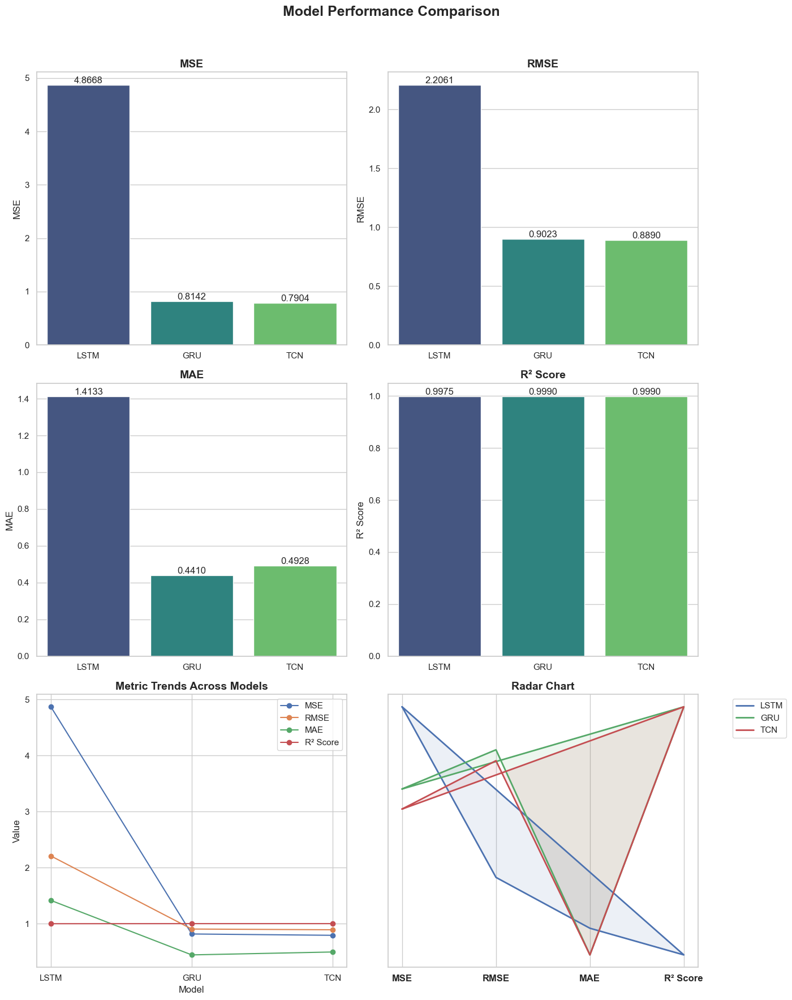

513/513 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

Horizon: 34
MSE: 4.8668, RMSE: 2.2061, MAE: 1.4133, R² Score: 0.9988

Sample Predictions:
Actual: 135.00, Predicted: 135.00
Actual: 190.00, Predicted: 188.00
Actual: 163.00, Predicted: 162.00
Actual: 140.00, Predicted: 140.00
Actual: 94.00, Predicted: 95.00
Actual: 211.00, Predicted: 208.00
Actual: 163.00, Predicted: 162.00
Actual: 137.00, Predicted: 137.00
Actual: 163.00, Predicted: 162.00
Actual: 326.00, Predicted: 318.00
Actual: 139.00, Predicted: 139.00
Actual: 130.00, Predicted: 130.00
After hba1c
Metrics(hba1c) for 34 minutes: RMSE: 2.2060900717110172, MAE: 1.4132861587262857, R² Score: 0.9988355406357223
Predicted HbA1c: 6.74%
 15/513 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step  

C:\Users\Muthu\AppData\Local\Temp\ipykernel_20036\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

Horizon: 34
MSE: 0.8142, RMSE: 0.9023, MAE: 0.4410, R² Score: 0.9998

Sample Predictions:
Actual: 164.00, Predicted: 164.00
Actual: 215.00, Predicted: 214.00
Actual: 188.00, Predicted: 188.00
Actual: 167.00, Predicted: 167.00
Actual: 96.00, Predicted: 95.00
Actual: 132.00, Predicted: 132.00
Actual: 62.00, Predicted: 61.00
Actual: 214.00, Predicted: 213.00
Actual: 163.00, Predicted: 163.00
Actual: 116.00, Predicted: 116.00
Actual: 140.00, Predicted: 140.00
Actual: 120.00, Predicted: 120.00
After hba1c
Metrics(hba1c) for 34 minutes: RMSE: 0.9023242117457249, MAE: 0.4409809064844751, R² Score: 0.9998051936635455
Predicted HbA1c: 6.75%
 13/513 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step  

C:\Users\Muthu\AppData\Local\Temp\ipykernel_20036\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")


513/513 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
513/513 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step

Horizon: 34
MSE: 0.7904, RMSE: 0.8890, MAE: 0.4928, R² Score: 0.9998

Sample Predictions:
Actual: 99.00, Predicted: 99.00
Actual: 154.00, Predicted: 154.00
Actual: 107.00, Predicted: 107.00
Actual: 333.00, Predicted: 332.00
Actual: 104.00, Predicted: 104.00
Actual: 86.00, Predicted: 86.00
Actual: 107.00, Predicted: 107.00
Actual: 107.00, Predicted: 107.00
Actual: 109.00, Predicted: 109.00
Actual: 120.00, Predicted: 120.00
Actual: 126.00, Predicted: 126.00
Actual: 141.00, Predicted: 141.00
After hba1c
Metrics(hba1c) for 34 minutes: RMSE: 0.8890434976733144, MAE: 0.4928323064722748, R² Score: 0.9998108859143298
Predicted HbA1c: 6.77%

Processing Training Data...


C:\Users\Muthu\AppData\Local\Temp\ipykernel_20036\226926000.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f"Actual: {float(selected_true_values[j]):.2f}, Predicted: {float(selected_predictions[j]):.2f}")



Processing File: E:/SEM8/Code/Ohio T1DM/OhioT1DM/2020/train/540-ws-training.xml
Extracted Weight: 99.0 kg
Time: 2020-05-19 11:36:29, Glucose: 76.00 mg/dL, Fuzzy Output: 0.28, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:41:29, Glucose: 72.00 mg/dL, Fuzzy Output: 0.28, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:46:29, Glucose: 68.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:51:29, Glucose: 65.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 11:56:29, Glucose: 63.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 12:01:29, Glucose: 66.00 mg/dL, Fuzzy Output: 0.27, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 12:06:29, Glucose: 71.00 mg/dL, Fuzzy Output: 0.28, Severity: Very Low, Prediction: Do not have diabetes.
Time: 2020-05-19 12:11:29, Gluco

In [14]:
if __name__ == "__main__":
    main()
